In [9]:
import cv2
import matplotlib.pyplot as plt

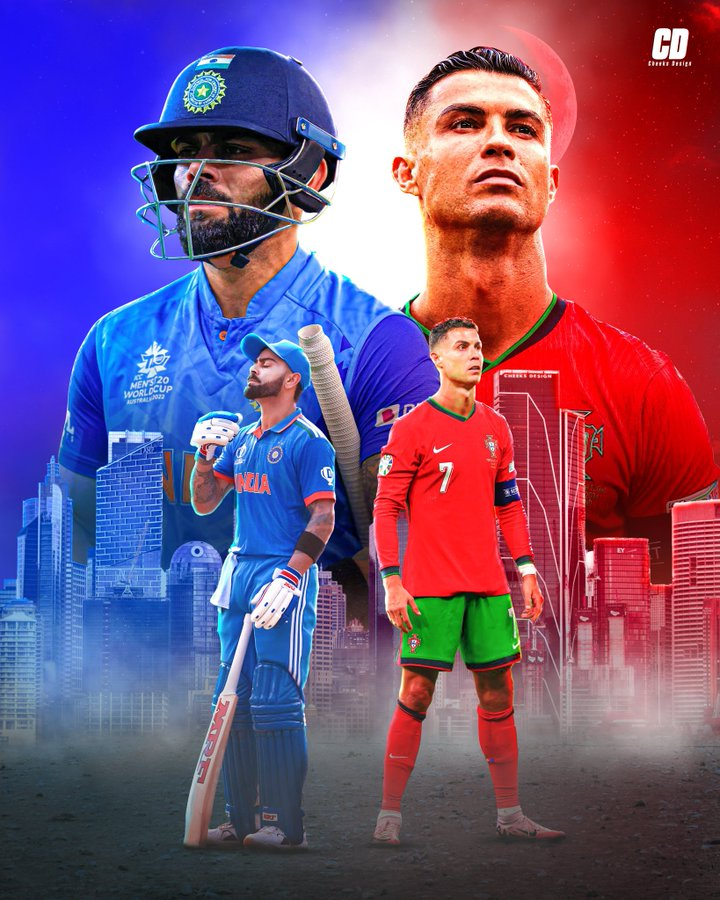

In [11]:
from IPython.display import Image, display
# Simply pass the file path
display(Image(filename='Data/test.jpg'))

In [15]:
# Display function
def display_image(image):
    # Display the image
    plt.imshow(image)
    plt.axis('off') # Optional: hides the x and y axes
    plt.show()

# Basic Image Operations

In [8]:
img = cv2.imread('Data/test.jpg')
print(f"Image: {img} |  type={type(img)}  |  dtype={img.dtype}  |  shape(height, width, channels)={img.shape}")  # numpy.ndarray

Image: [[[235  18  33]
  [236  19  34]
  [238  18  34]
  ...
  [ 18  15 118]
  [ 18  14 119]
  [ 16  14 120]]

 [[235  18  33]
  [236  19  34]
  [238  18  34]
  ...
  [ 18  13 118]
  [ 19  15 121]
  [ 21  16 125]]

 [[237  17  33]
  [237  17  33]
  [238  18  34]
  ...
  [ 20  14 123]
  [ 22  15 126]
  [ 22  14 128]]

 ...

 [[ 42  39  34]
  [ 38  35  30]
  [ 40  37  32]
  ...
  [ 33  34  38]
  [ 36  37  41]
  [ 39  40  44]]

 [[ 36  33  28]
  [ 33  30  25]
  [ 35  32  27]
  ...
  [ 35  36  40]
  [ 36  37  41]
  [ 38  39  43]]

 [[ 31  28  23]
  [ 28  25  20]
  [ 31  28  23]
  ...
  [ 32  33  37]
  [ 31  32  36]
  [ 32  33  37]]] |  type=<class 'numpy.ndarray'>  |  dtype=uint8  |  shape(height, width, channels)=(900, 720, 3)


-1

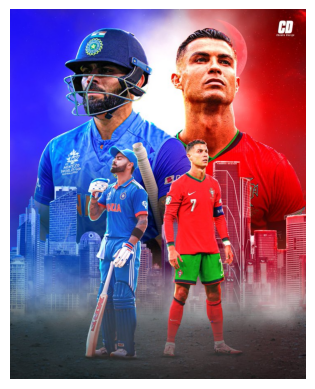

In [10]:
# Convert BGR to RGB
# OpenCV loads images in BGR format, but Matplotlib expects RGB.
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Display the image
plt.imshow(img_rgb)
plt.axis('off') # Optional: hides the x and y axes
plt.show()

In [12]:
pixel = img[100, 200]
print(pixel)   # [B, G, R]

[254 236 145]


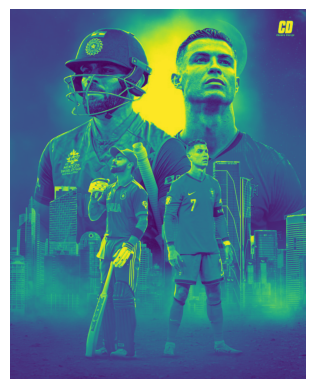

In [16]:
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
display_image(gray)

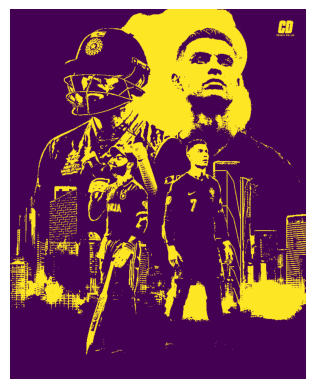

In [17]:
_, binary = cv2.threshold(gray, 127, 255, cv2.THRESH_BINARY)
display_image(binary)

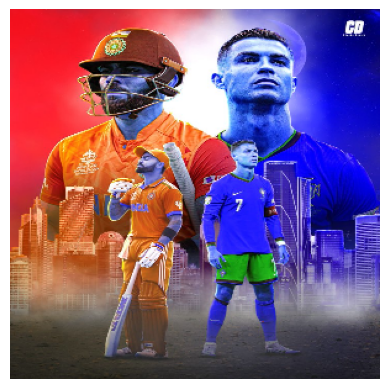

In [18]:
resized = cv2.resize(img, (300, 300))
display_image(resized)

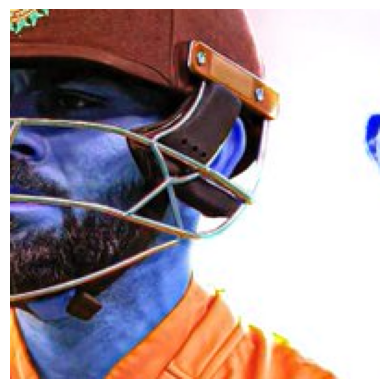

In [19]:
# Cropping
crop = img[100:300, 200:400]
display_image(crop)

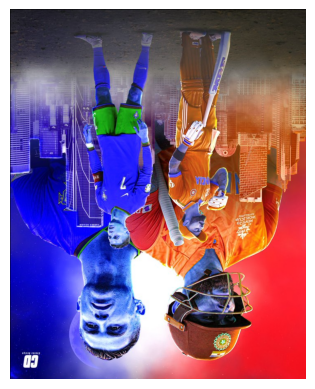

In [22]:
# Rotation
(h, w) = img.shape[:2]
M = cv2.getRotationMatrix2D((w//2, h//2), 180, 1)
rotated = cv2.warpAffine(img, M, (w, h))
display_image(rotated)

# Arithmetic Operations on Images

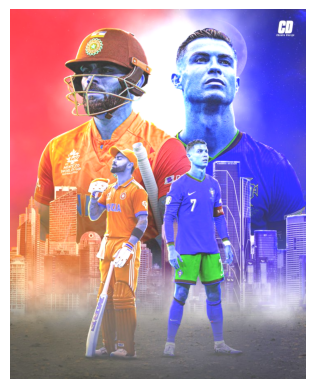

In [23]:
# Increasing brightness
bright = cv2.add(img, 50)
display_image(bright)

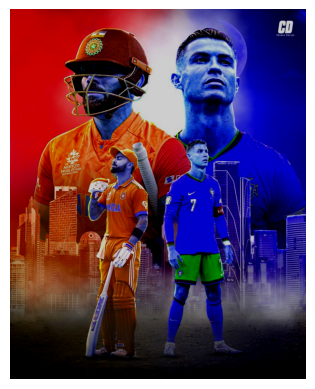

In [24]:
# Decreasing brightness
dark = cv2.subtract(img, 50)
display_image(dark)

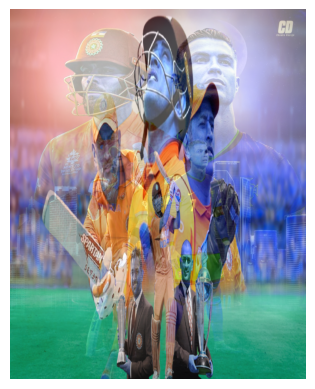

In [29]:
# Blending two images
img1 = cv2.imread('Data/Test.jpg')
img2 = cv2.imread('Data/test2.jpg')    
width = img1.shape[1]
height = img1.shape[0]
img2_resized = cv2.resize(img2, (width, height))
blend = cv2.addWeighted(img1, 0.3, img2_resized, 0.7, 0)
display_image(blend)

# Logical Operations

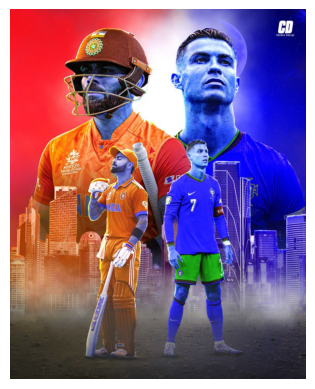

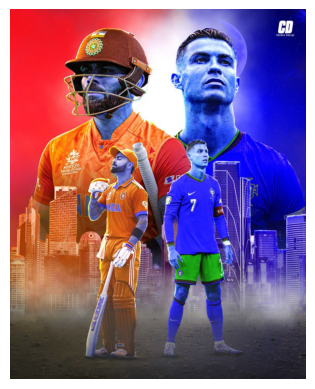

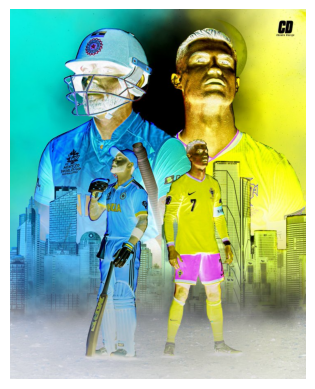

In [32]:
# Bitwise operations
mask = cv2.imread('Data/Test.jpg')
and_img = cv2.bitwise_and(img, mask)
or_img  = cv2.bitwise_or(img, mask)
not_img = cv2.bitwise_not(img)
display_image(and_img)
display_image(or_img)
display_image(not_img)

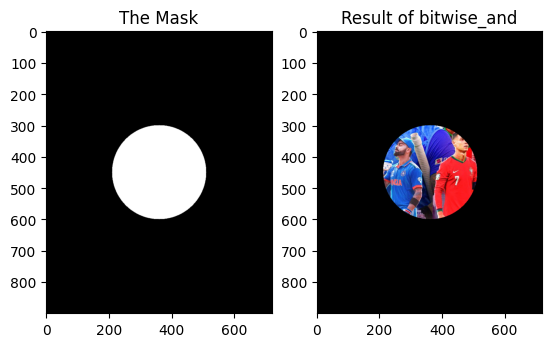

In [33]:
import numpy as np
img = cv2.imread('Data/Test.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) # Fix colors for Jupyter

# 1. Create Mask (Black background, White circle)
mask = np.zeros(img.shape[:2], dtype="uint8")
center_x, center_y = img.shape[1] // 2, img.shape[0] // 2
cv2.circle(mask, (center_x, center_y), 150, 255, -1)

# 2. Apply AND (Cuts out the circle)
# We use img, img because bitwise_and expects two source images. 
# The 'mask' parameter restricts the operation to the white area.
masked_img = cv2.bitwise_and(img, img, mask=mask)

# Display result
plt.subplot(1, 2, 1); plt.imshow(mask, cmap='gray'); plt.title("The Mask")
plt.subplot(1, 2, 2); plt.imshow(masked_img); plt.title("Result of bitwise_and")
plt.show()

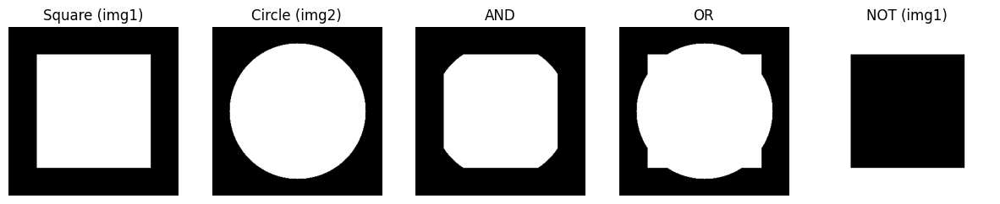

In [35]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Create two simple black and white images
img1 = np.zeros((300, 300), dtype="uint8")
cv2.rectangle(img1, (50, 50), (250, 250), 255, -1) # A white square

img2 = np.zeros((300, 300), dtype="uint8")
cv2.circle(img2, (150, 150), 120, 255, -1)      # A white circle

# Perform bitwise operations
bit_and = cv2.bitwise_and(img1, img2)
bit_or  = cv2.bitwise_or(img1, img2)
bit_not = cv2.bitwise_not(img1)

# Plotting
titles = ['Square (img1)', 'Circle (img2)', 'AND', 'OR', 'NOT (img1)']
images = [img1, img2, bit_and, bit_or, bit_not]

plt.figure(figsize=(15, 5))
for i in range(5):
    plt.subplot(1, 5, i+1)
    plt.imshow(images[i], 'gray')
    plt.title(titles[i])
    plt.axis('off')
plt.show()

# Point Operations (Pixel-wise)

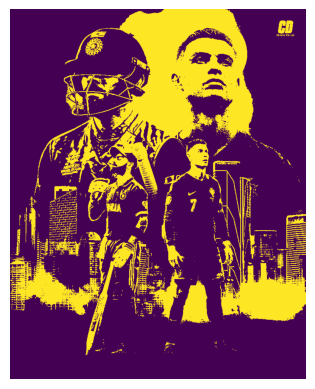

In [40]:
# gray 
_, thresh = cv2.threshold(gray, 120, 255, cv2.THRESH_BINARY)
display_image(thresh)

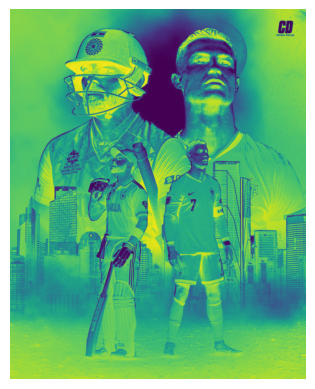

In [41]:
# negative
negative = 255 - gray
display_image(negative)

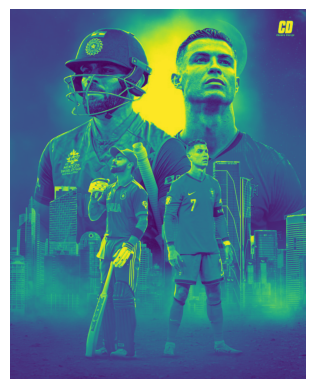

In [42]:
# contrast stretching
min_val = np.min(gray)
max_val = np.max(gray)

stretched = ((gray - min_val) / (max_val - min_val)) * 255
stretched = stretched.astype("uint8")
display_image(stretched)

# Filtering / Smoothing

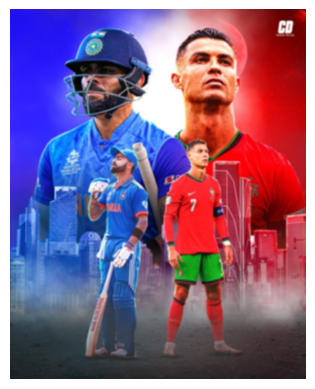

In [43]:
# blur
blur = cv2.blur(img, (5, 5))
display_image(blur)

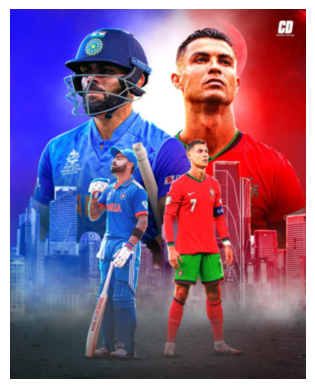

In [44]:
# Gaussian blur
gauss = cv2.GaussianBlur(img, (5, 5), 0)
display_image(gauss)

### how blurring operation works and how gaussian blur works

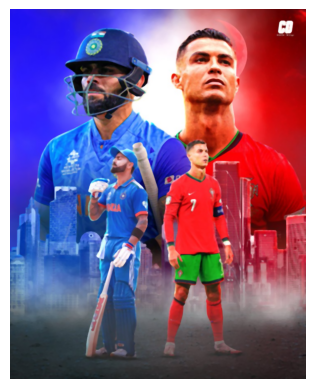

In [46]:
# median blur
median = cv2.medianBlur(img, 5)
display_image(median)

# Edge Detection

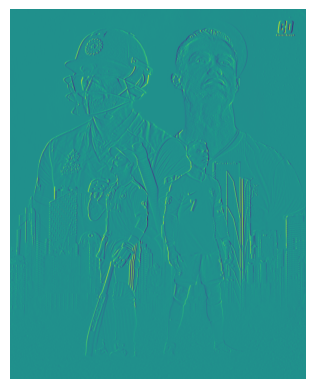

In [47]:
# Sobel edge detection
sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0)
display_image(sobelx)

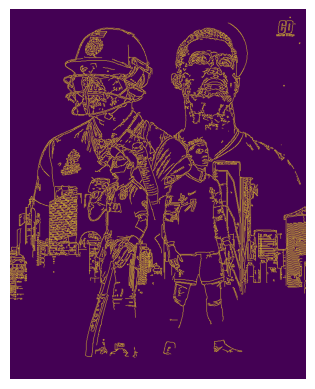

In [48]:
# Canny edge detection
edges = cv2.Canny(gray, 100, 200)
display_image(edges)

# Morphological Operations

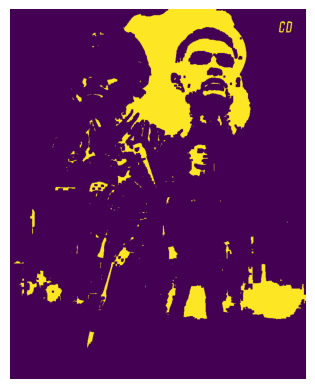

In [49]:
# Erosion
kernel = np.ones((5,5), np.uint8)
erode = cv2.erode(binary, kernel, iterations=1)
display_image(erode)

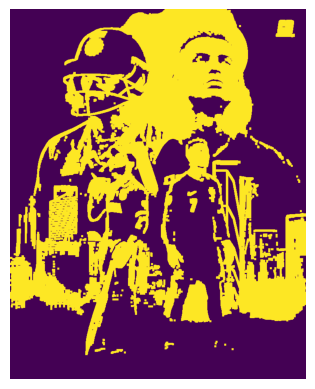

In [50]:
# Dilation
dilate = cv2.dilate(binary, kernel, iterations=1)
display_image(dilate)

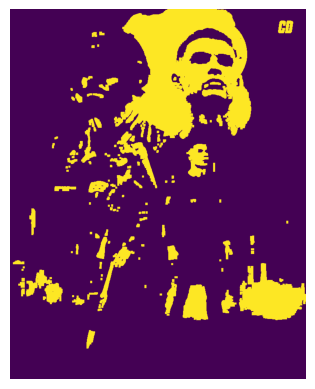

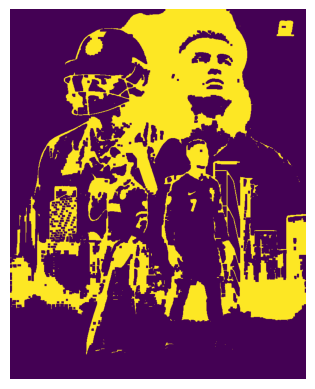

In [51]:
# Opening and Closing
opening = cv2.morphologyEx(binary, cv2.MORPH_OPEN, kernel)
closing = cv2.morphologyEx(binary, cv2.MORPH_CLOSE, kernel)
display_image(opening)
display_image(closing)

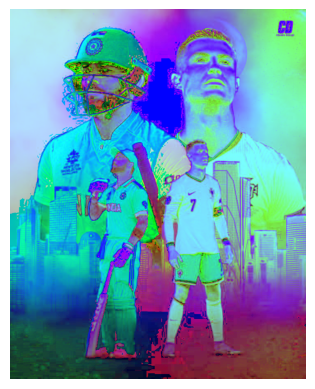

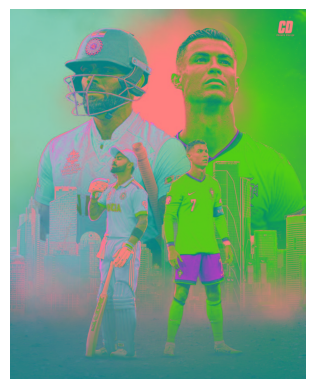

In [52]:
# Color Space Conversion
hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
display_image(hsv)
display_image(lab)

# Histogram Operations

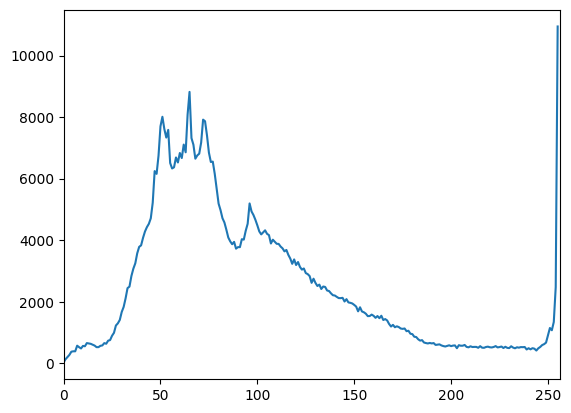

In [53]:

hist = cv2.calcHist([gray], [0], None, [256], [0,256])
plt.plot(hist)
plt.xlim([0,256])
plt.show()


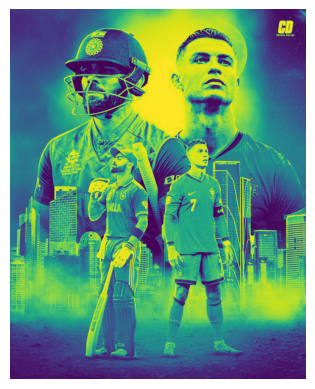

In [55]:
# Histogram Equalization
equalized = cv2.equalizeHist(gray)
display_image(equalized)

# Image Geometry

## 1.1 Affine Transformation

Scaling Factor: 0.5


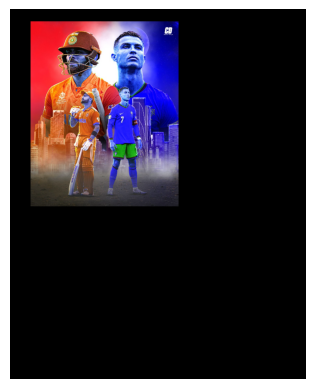

Scaling Factor: 1


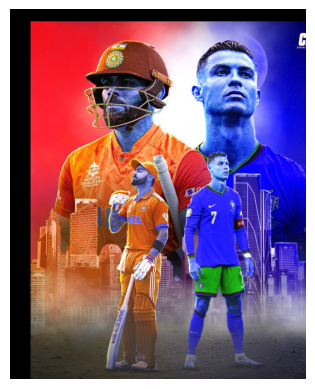

Scaling Factor: 1.5


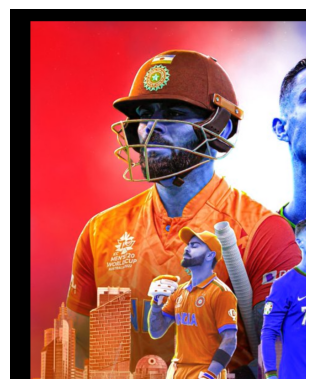

Scaling Factor: 2


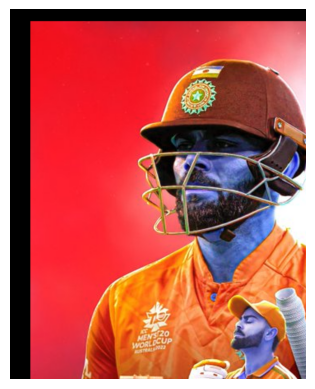

In [65]:
import cv2
import numpy as np

img = cv2.imread("Data/Test.jpg")
(h, w) = img.shape[:2]

for i in [0.5,1,1.5,2]:
    print(f"Scaling Factor: {i}")
    M = np.float32([
        [i, 0, 50],   # x shift
        [0, i, 30]    # y shift
    ])

    affine = cv2.warpAffine(img, M, (w, h))
    display_image(affine)


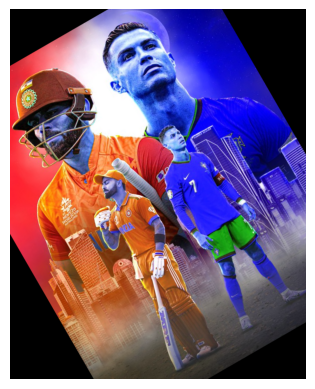

In [57]:
M = cv2.getRotationMatrix2D((w//2, h//2), 30, 1.0)
rotated = cv2.warpAffine(img, M, (w, h))
display_image(rotated)

# 1.2 Perspective Transformation

### Perspective Transformation

**What it does:**
*   ✔ Simulates camera viewpoint
*   ✔ Parallel lines can meet (Vanishing point)

**Common Applications:**
*   **Document scanning:** Flattening a photo of a page taken at an angle.
*   **Lane detection:** Getting a "birds-eye view" of a road.
*   **Augmented Reality (AR):** Projecting 2D images onto 3D surfaces.

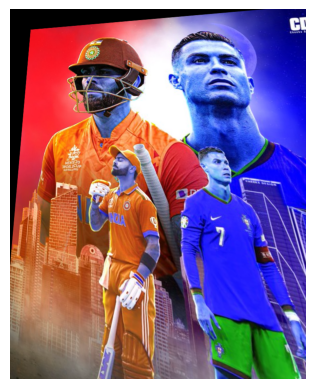

In [66]:
# Perspective Transformation
pts1 = np.float32([[0,0], [300,0], [0,300], [300,300]])
pts2 = np.float32([[50,50], [280,30], [30,280], [300,300]])

M = cv2.getPerspectiveTransform(pts1, pts2)
warp = cv2.warpPerspective(img, M, (w, h))
display_image(warp)

# Feature Detection

***Harris Corner Detection***
Idea

*  Corners = large intensity change in both x and y
* Edges → change in one direction
* Flat → no change

Limitation

❌ Not scale invariant
❌ Not rotation invariant

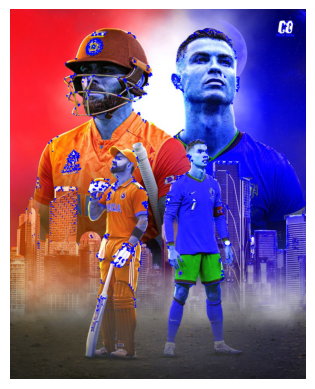

In [69]:
# Harris Corner Detection
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
gray = np.float32(gray)

dst = cv2.cornerHarris(gray, 2, 3, 0.04)
img[dst > 0.01 * dst.max()] = [0,0,255]
display_image(img)

***SIFT (Scale-Invariant Feature Transform)***


Why SIFT is powerful

* ✔ Scale invariant
* ✔ Rotation invariant
* ✔ Robust to illumination
* kp → keypoints
* des → 128-dim feature vector


DL connection


* SIFT ≈ hand-crafted CNN features
* CNNs learn these automatically.

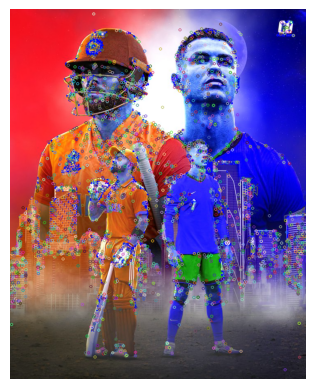

In [71]:
sift = cv2.SIFT_create()
gray_uint8 = gray.astype('uint8')
kp, des = sift.detectAndCompute(gray_uint8, None)

img_sift = cv2.drawKeypoints(img, kp, None)
display_image(img_sift)

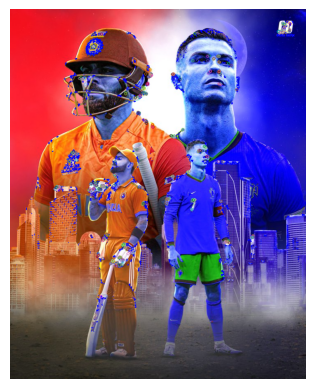

In [73]:
# ORB Feature Detection
orb = cv2.ORB_create()
kp, des = orb.detectAndCompute(gray_uint8, None)
img_orb = cv2.drawKeypoints(img, kp, None)
display_image(img_orb)


# Segmentation

***(Separate objects from background)***

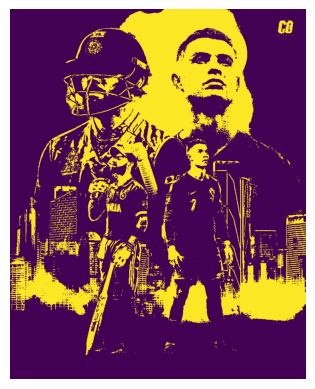

In [74]:
# Thresholding (Basic)
_, thresh = cv2.threshold(gray, 120, 255, cv2.THRESH_BINARY)
display_image(thresh)

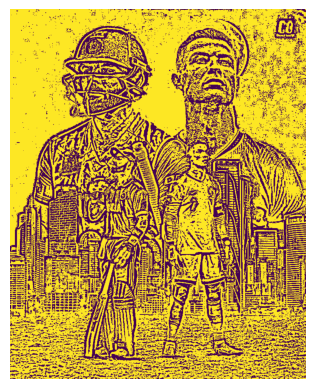

In [80]:
# Adaptive Threshold
import cv2

# If 'gray' is currently your color image:
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY) 

# Now run the threshold
th = cv2.adaptiveThreshold(
    gray, 255,
    cv2.ADAPTIVE_THRESH_MEAN_C,
    cv2.THRESH_BINARY,
    11, 2
)
display_image(th)

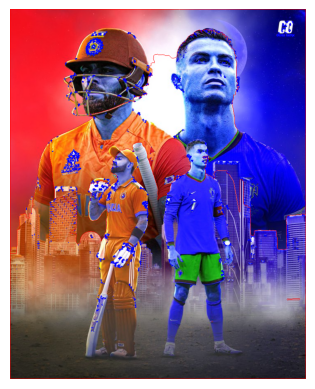

In [81]:
# Watershed Segmentation (IMPORTANT)
# Intuition

# Think of image as mountains & valleys
# Water flows → boundaries form

kernel = np.ones((3,3), np.uint8)

opening = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, kernel, 2)
sure_bg = cv2.dilate(opening, kernel, 3)

dist = cv2.distanceTransform(np.uint8(opening), cv2.DIST_L2, 5)
_, sure_fg = cv2.threshold(dist, 0.7*dist.max(), 255, 0)

markers = cv2.connectedComponents(np.uint8(sure_fg))[1]
markers = cv2.watershed(img, markers)

img[markers == -1] = [255,0,0]
display_image(img)

# Single Classical Computer Vision Pipeline (One Code)

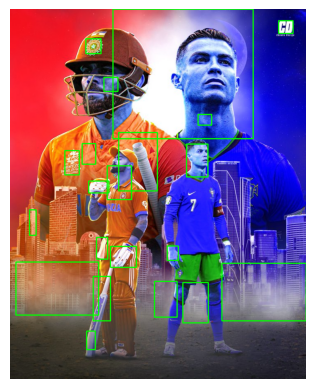

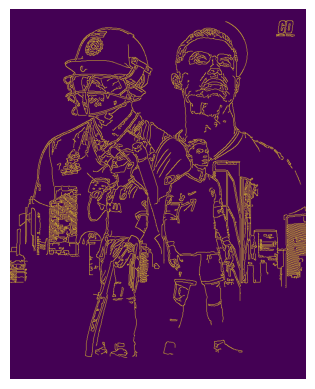

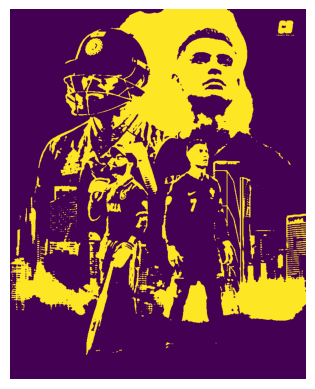

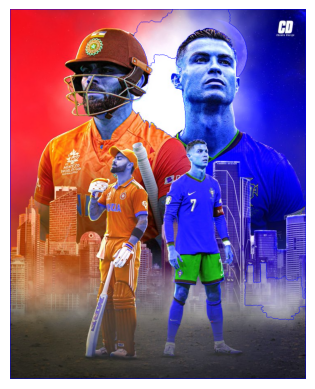

In [82]:
import cv2
import numpy as np

# -----------------------------
# 1. Read Image
# -----------------------------
img = cv2.imread("Data/Test.jpg")
orig = img.copy()

# -----------------------------
# 2. Preprocessing
# -----------------------------
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
blur = cv2.GaussianBlur(gray, (5, 5), 0)

# -----------------------------
# 3. Edge Detection
# -----------------------------
edges = cv2.Canny(blur, 50, 150)

# -----------------------------
# 4. Thresholding (Otsu)
# -----------------------------
_, thresh = cv2.threshold(
    blur, 0, 255,
    cv2.THRESH_BINARY + cv2.THRESH_OTSU
)

# -----------------------------
# 5. Morphological Operations
# -----------------------------
kernel = np.ones((5, 5), np.uint8)
opening = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, kernel, iterations=2)
sure_bg = cv2.dilate(opening, kernel, iterations=3)

# -----------------------------
# 6. Distance Transform
# -----------------------------
dist = cv2.distanceTransform(opening, cv2.DIST_L2, 5)
_, sure_fg = cv2.threshold(dist, 0.7 * dist.max(), 255, 0)

sure_fg = np.uint8(sure_fg)
unknown = cv2.subtract(sure_bg, sure_fg)

# -----------------------------
# 7. Watershed Segmentation
# -----------------------------
_, markers = cv2.connectedComponents(sure_fg)
markers = markers + 1
markers[unknown == 255] = 0

markers = cv2.watershed(img, markers)
img[markers == -1] = [0, 0, 255]  # boundaries

# -----------------------------
# 8. Contour Detection
# -----------------------------
contours, _ = cv2.findContours(
    opening, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE
)

for cnt in contours:
    area = cv2.contourArea(cnt)
    if area > 500:
        x, y, w, h = cv2.boundingRect(cnt)
        cv2.rectangle(orig, (x, y), (x + w, y + h), (0, 255, 0), 2)

# -----------------------------
# 9. Display Results
# -----------------------------
display_image(orig)
display_image(edges)
display_image(thresh)
display_image(img)  



Displaying Results...
1. Original Image


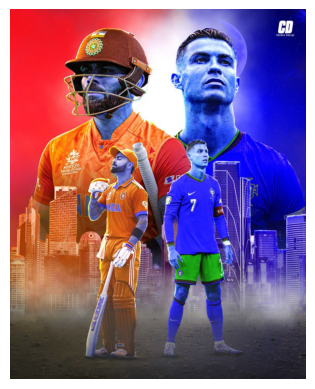

2. Edges WITHOUT Blur (Noisy)


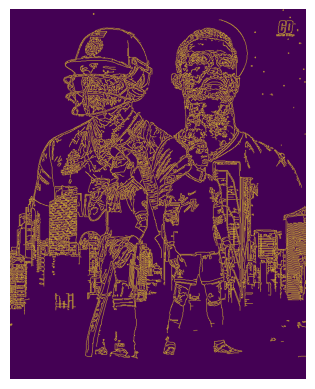

3. Edges WITH Blur (Clean)


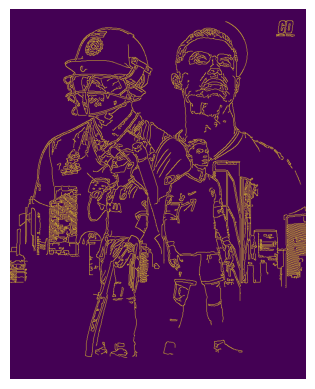

4. Canny LOW Thresholds


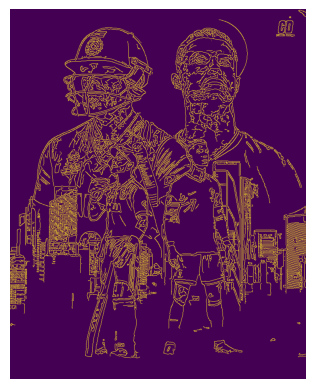

5. Canny HIGH Thresholds


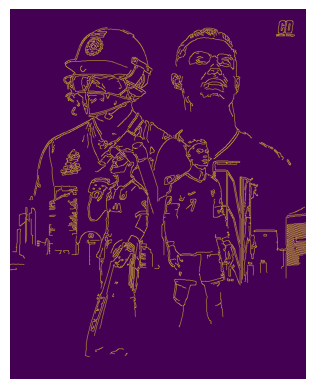

6. Threshold Only


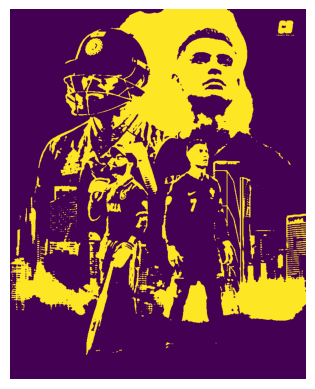

7. Morphology Kernel 3x3


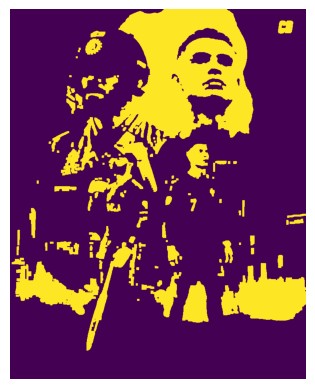

8. Morphology Kernel 7x7


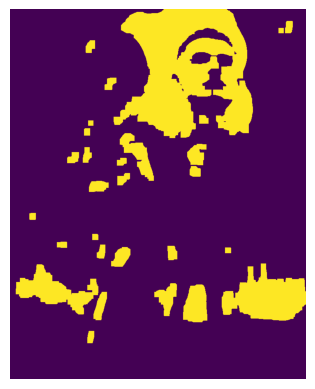

9. Watershed Segmentation


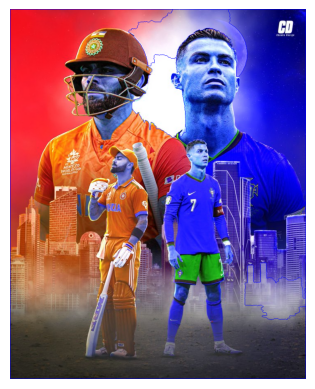

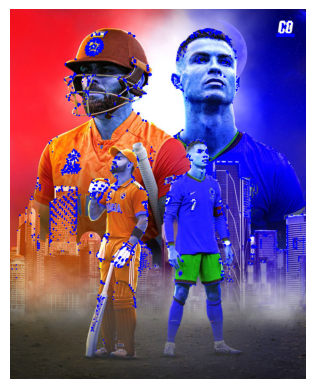

In [84]:
import cv2
import numpy as np

# -----------------------------
# Read Image
# -----------------------------
img = cv2.imread("Data/Test.jpg")
orig = img.copy()

gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# =============================
# 1️⃣ TRY DIFFERENT KERNEL SIZES
# =============================
kernel_3 = np.ones((3, 3), np.uint8)
kernel_7 = np.ones((7, 7), np.uint8)

# =============================
# 2️⃣ REMOVE GAUSSIAN BLUR
# =============================
blur = cv2.GaussianBlur(gray, (5, 5), 0)

edges_no_blur = cv2.Canny(gray, 50, 150)
edges_blur = cv2.Canny(blur, 50, 150)

# =============================
# 3️⃣ CHANGE CANNY THRESHOLDS
# =============================
edges_low = cv2.Canny(blur, 30, 80)
edges_high = cv2.Canny(blur, 100, 200)

# =============================
# 4️⃣ THRESHOLD vs WATERSHED
# =============================
_, thresh = cv2.threshold(
    blur, 0, 255,
    cv2.THRESH_BINARY + cv2.THRESH_OTSU
)

# --- Morphology with different kernels ---
open_3 = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, kernel_3, iterations=2)
open_7 = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, kernel_7, iterations=2)

# --- Watershed ---
sure_bg = cv2.dilate(open_3, kernel_3, iterations=3)
dist = cv2.distanceTransform(open_3, cv2.DIST_L2, 5)
_, sure_fg = cv2.threshold(dist, 0.7 * dist.max(), 255, 0)

sure_fg = np.uint8(sure_fg)
unknown = cv2.subtract(sure_bg, sure_fg)

_, markers = cv2.connectedComponents(sure_fg)
markers = markers + 1
markers[unknown == 255] = 0

markers = cv2.watershed(img, markers)
watershed_result = img.copy()
watershed_result[markers == -1] = [0, 0, 255]

# =============================
# DISPLAY RESULTS
# =============================
print("Displaying Results...")
print("1. Original Image")
display_image(orig)
print("2. Edges WITHOUT Blur (Noisy)")
display_image(edges_no_blur)
print("3. Edges WITH Blur (Clean)")
display_image(edges_blur)
print("4. Canny LOW Thresholds")
display_image(edges_low)
print("5. Canny HIGH Thresholds")
display_image(edges_high)
print("6. Threshold Only")
display_image(thresh)
print("7. Morphology Kernel 3x3")
display_image(open_3)
print("8. Morphology Kernel 7x7")
display_image(open_7)
print("9. Watershed Segmentation")
display_image(watershed_result)

# Harris Corner Detection
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
harris = cv2.cornerHarris(gray, 2, 3, 0.04)
harris = cv2.dilate(harris, None)
img[harris > 0.01 * harris.max()] = [0, 0, 255]
display_image(img)
